<a href="https://colab.research.google.com/github/fcastellanosp/MINE-4206_202410_AML/blob/main/Talleres/Taller%205/Taller%205.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

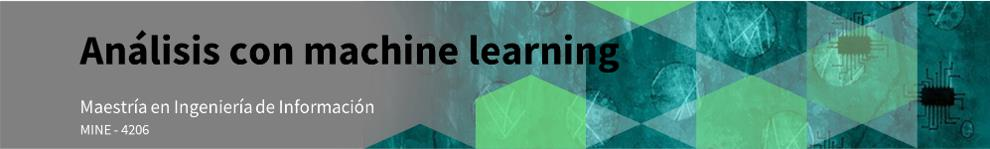

- **Integrante 1:** María Catalina Ibáñez Piñeres
- **Integrante 2:** Lina María Gómez Mesa

---
# Contexto y objetivos.

Uno de los esquemas más importantes que han evolucionado gracias a la tecnología es el ambiente financiero. El cual ha facilitado a los usuarios préstamos a sus clientes para diferentes inversiones que puedan requerir los usuarios y generar utilidades mediante este tipo de transacciones.

Los bancos incurren en pérdidas cuando un cliente no paga sus préstamos a tiempo. Debido a esto, cada año, los bancos tienen pérdidas en crores, y esto también impacta en gran medida el crecimiento económico del país. En este hackathon, analizamos varios atributos como el monto financiado, la ubicación, el préstamo, el saldo, etc., para predecir si una persona será un incumplidor de préstamos o no.

Por esta razón, la entidad financiera cuenta con una base de datos que registra la información de los préstamos y el estado de cartera, dónde se conoce si el usuario se encuentra o no en mora.

**Objetivos de desarrollo**:

* Resolver un problema de detección de anomalías.
* Realizar el entrenamiento de una sola clase.
* Analizar la Arquitectura de los AutoEncoders.
* Guardar el el autoencoder entrenado en modo competencia.

**Datos**: La fuente de datos inicial fue tomada del dataset [Bank Loan Defaulter Prediction](https://www.kaggle.com/datasets/ankitkalauni/bank-loan-defaulter-prediction-hackathon), no obstante, la información ha sido preparada para trabajar en el modelamiento.

# Entendimiento del negocio.

Para tener un mejor detalle sobre el comportamiento de las variables, solicitamos a la organización el diccionario de datos y nos suministró la siguiente información:

| ATRIBUTO | DEFINICIÓN |
| :- | :- |
| **ID** | Identificador único de la instancia.|
| **Loan Amount** | Valor del monto del préstamo.|
| **Funded Amount** | Valor financiado del préstamo.|
| **Funded Amount Investor** | Inversor de la canidad financiada.|
| **Term** | Plazo del préstamo (en meses).|
| **Interest Rate** | Tasa de interés del préstamo.|
| **Grade** | Calificación del banco.|
| **Employment Duration** | Tiempo laborado.|
| **Home Ownership** | Propietario de la vivienda.|
| **Verification Status** | Estado de verificación de ingresos por parte del banco.|
| **Debit to Income** | Relación entre el pago mensual de la dueda, dividida entre los ingresos mensuales autodeclarados. Exlucye la hipoteca. |
| **Delinquency - two years** | Tiempo reportado como moroso (30+número de días) en los 2 últimos años.|
| **Inquires - six months** | Número total de consultas en los 6 últimos meses.|
| **Open Account** | Número de líneas de crédito abiertas en la línea de crédito del representante.|
| **Public Record** | Número de registros públicos desfavorables.|
| **Revolving Balance** | Saldo total de crédito rotativo.|
| **Revolving Utilities** | Cantidad de crédito que está utilizando un representante en relación con **Revolving Balance**.|
| **Total Accounts** | Número total de líneas de crédito disponibles en la línea de crédito del representante.|
| **Initial List Status** | Estado de listado único del préstamo - W (En espera), F (Enviado).|
| **Total Received Interest** | Intereses totales recibidos hasta la fecha.|
| **Total Received Late Fee** | Total de tarifas por mora recibidas hasta la fecha.|
| **Recoveries** | Recuperación bruta posterior a la cancelación de la deuda.|
| **Collection Recovery Fee** | Tarifa de cobranza posterior a la cancelación de la deuda.|
| **Collection 12 months Medical** | Cobranzas totales en los últimos 12 meses excluyendo las colecciones médicas.|
| **Application Type** | Indica si la representación es individual o conjunta.|
| **Last week Pay** | Indica cuánto tiempo (en semanas) un representante ha pagado EMI después de la inscripción en el lote.|
| **Accounts Delinquent** | Número de cuentas en las que el representante está en mora.|
| **Total Collection Account** | Saldo total actual de todas las cuentas.|
| **Total Current Balance** | Saldo total actual de todas las cuentas.|
| **Total Revolving Credit Limit** | Límite total de crédito rotativo.|
| **Loan Status** | Estado de cuenta, 1 indica se encuentra en mora y 0 se encuentra al día.|

# Actividades a realizar.

1. Realizar el análisis exploratorio de la información.

2. Generar un pipeline para el tratamiento de la información.

3. Diseñar un autoencoder el cuál sea entrenado a partir de la clase normal. Tenga en cuenta que la métrica debe ser el **accuracy**. La arquitectura debe tener el número de capas que considere adecuado para el contexto de un autoencoder. Realice la interpretación de los resultados obtenidos.

4. Construir las gráficas de entrenamiento, validación. Debes interpretar los resultados obtenidos para este modelo base.

5. Realizar la identificación de hiperparámetros, justificando la elección de los valores correspondientes.

6. Reconstruir los resultados usando el mejor modelo y usando los datos de prueba. Realice el proceso de interpretación de los resultados obtenidos.

7. **Bono**: Almacena el joblib de la preparación de los datos y el autoencoder, de esta forma serán evaluados los resultados obtenidos y publicados en un ranking, los 3 mejores grupos con los resultados obtenidos evaluando datos nuevos y evaluando la métrica, obtendrán la bonificación de este taller.

**Entregables**: Debe cargar a bloque neón la siguiente información:

* Notebook ejecutado. En la última línea del notebook, especifique una variable denominada **encorder_fields**, dónde se encuentren las columnas que finalmente usará el modelo.
* Archivo HTML del notebook ejecutado.
* Joblib de preparación de datos.
* Modelo del autoencoder del mejor modelo obtenido.

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport
import numpy as np

In [3]:
normal = pd.read_csv("https://raw.githubusercontent.com/fcastellanosp/MINE-4206_202410_AML/main/Talleres/Taller%205/normal.csv")
normal

,ID,Loan Amount,Funded Amount,Funded Amount Investor,Term,Interest Rate,Grade,Employment Duration,Home Ownership,Verification Status,...,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Application Type,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit,Loan Status
0,65087372,10000,32236,12329.36286,59,11.135007,B,MORTGAGE,176346.62670,Not Verified,...,2.498291,0.793724,0,INDIVIDUAL,49,0,31,311301,6619,0
1,1450153,3609,11940,12191.99692,59,12.237563,C,RENT,39833.92100,Source Verified,...,2.377215,0.974821,0,INDIVIDUAL,109,0,53,182610,20885,0
2,1969101,28276,9311,21603.22455,59,12.545884,F,MORTGAGE,91506.69105,Source Verified,...,4.316277,1.020075,0,INDIVIDUAL,66,0,34,89801,26155,0
3,6651430,11170,6954,17877.15585,59,16.731201,C,MORTGAGE,108286.57590,Source Verified,...,0.107020,0.749971,0,INDIVIDUAL,39,0,40,9189,60214,0
4,14354669,16890,13226,13539.92667,59,15.008300,C,MORTGAGE,44234.82545,Source Verified,...,1294.818751,0.368953,0,INDIVIDUAL,18,0,430,126029,22579,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61217,7273094,11440,17672,22965.76290,59,15.025260,C,RENT,76128.78634,Verified,...,0.061096,0.325564,0,INDIVIDUAL,151,0,38,859647,21468,0
61218,35182714,8323,11046,15637.46301,59,9.972104,C,RENT,65491.12817,Source Verified,...,2.015494,1.403368,0,INDIVIDUAL,14,0,37,22692,8714,0
61219,16435904,15897,32921,12329.45775,59,19.650943,A,MORTGAGE,34813.96985,Verified,...,5.673092,1.607093,0,INDIVIDUAL,137,0,17,176857,42330,0
61220,5300325,16567,4975,21353.68465,59,13.169095,D,OWN,96938.83564,Not Verified,...,1.157454,0.207608,0,INDIVIDUAL,73,0,61,361339,39075,0


In [4]:
test = pd.read_csv("https://raw.githubusercontent.com/fcastellanosp/MINE-4206_202410_AML/main/Talleres/Taller%205/test.csv")
test

,ID,Loan Amount,Funded Amount,Funded Amount Investor,Term,Interest Rate,Grade,Employment Duration,Home Ownership,Verification Status,...,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Application Type,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit,Loan Status
0,2567369,13778,11656,26105.702520,59,13.382068,A,MORTGAGE,49537.72103,Verified,...,5.090907,1.171816,0,INDIVIDUAL,53,0,30,305148,1604,0
1,60690195,23891,25795,13254.362100,59,11.307417,D,MORTGAGE,72171.74951,Verified,...,6.579831,0.551025,0,INDIVIDUAL,60,0,45,151330,20090,0
2,33860189,3500,3500,3500.000000,36,10.150000,B,RENT,43000.00000,Not Verified,...,0.000000,0.000000,0,INDIVIDUAL,65,0,0,32926,8700,0
3,24927916,16588,9495,12123.544890,59,10.857981,B,RENT,66775.05376,Source Verified,...,3.165733,1.170445,0,INDIVIDUAL,10,0,25,44232,88161,0
4,8658608,9179,34461,2120.247381,59,17.392819,C,RENT,105507.03900,Source Verified,...,0.133916,0.547749,0,INDIVIDUAL,116,0,32,17616,24383,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28907,11791863,20531,14637,20873.672020,58,8.816036,C,MORTGAGE,54832.47671,Source Verified,...,8.240559,0.263531,0,INDIVIDUAL,38,0,54,107593,30035,0
28908,7781823,9048,18664,8055.725617,59,8.206810,C,RENT,64463.45373,Source Verified,...,3.930009,0.883955,0,INDIVIDUAL,2,0,28,352559,1735,1
28909,4239688,29084,31199,10128.795360,59,11.977165,C,RENT,68783.92330,Verified,...,1.619850,0.906886,0,INDIVIDUAL,6,0,59,203771,3191,0
28910,14600261,12778,21387,7615.936459,59,10.311443,D,RENT,154143.34970,Verified,...,0.823018,0.105983,0,INDIVIDUAL,36,0,38,315029,1385,0


## Punto 1 y 2: Análisis exploratorio y pipeline de datos.

### 1. Introducción a los datos

Se realiza el entendimiento de los datos a través de las siguientes etapas:
- Saber qué significa un registro en la fuente de datos
    - Identificar el tipo de datos de cada columna
- Determinar qué reglas de negocio se ven en los datos
    - Buscar dependencia entre atributos, para evaluar consistencia
- Verificar la calidad de datos
    - Evaluar los criterios de completitud, unicidad, consistencia, validez

Los pasos no se realizan en orden.

Se revisa el tipo de dato de cada atributo:

In [5]:
normal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61222 entries, 0 to 61221
Data columns (total 31 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   ID                            61222 non-null  int64  
 1   Loan Amount                   61222 non-null  int64  
 2   Funded Amount                 61222 non-null  int64  
 3   Funded Amount Investor        61222 non-null  float64
 4   Term                          61222 non-null  int64  
 5   Interest Rate                 61222 non-null  float64
 6   Grade                         61222 non-null  object 
 7   Employment Duration           61222 non-null  object 
 8   Home Ownership                61222 non-null  float64
 9   Verification Status           61222 non-null  object 
 10  Debit to Income               61222 non-null  float64
 11  Delinquency - two years       61222 non-null  int64  
 12  Inquires - six months         61222 non-null  int64  
 13  O

Se observa que, al importar los datos, las columnas Grade, Employment Duration, Verification Status, Initial List Status y Application Type se importan como object por lo tanto son categóricas.

Por otro lado, se observa que las columnas ID, Loan Amount, Funded Amount, Term, Delinquency - two years, Inquires - six months, Open Account, Public Record, Revolving Balance, Total Accounts, Collection 12 months Medical, Last week Pay, Accounts Delinquent, Total Collection Amount, Total Current Balance, Total Revolving Credit Limit y Loan Status son de tipo int64. Mientras que Funded Amount Investor, Interest Rate, Home Ownership, Debit to Income, Revolving Utilities, Total Received Interest, Total Received Late Fee, Recoveries y Collection Recovery Fee son de tipo float64.

No obstante, ID es un identificador único por lo que es categórica, se procede entonces a cambiar el tipo de dato de ID a object. Por otra lado, se observa que Loan Status es una variable booleana que toma valores 0 o 1. Por lo que se procede a cambiar el tipo de dato de Loan Status a object, porque es categórica.

Esto aún no corresponde a preparación de datos. Los datos no se modifican, únicamente se cambia el tipo de dato. De lo contrario, esta exploración de datos sería engañosa.

#TODO: No entiendo Home Ownership (dice que es propietario de la vivienda pero tiene valores float). Revisar. Total Collection Account y Total Current Balance tienen la misma definición en el diccionario de datos

In [6]:
normal['ID'] = normal['ID'].astype('object')
normal['Loan Status'] = normal['Loan Status'].astype('object')

#### 1.1. Exploración de los datos

Se muestran a continuación los estadísticos descriptivos de las variables numéricas:

In [7]:
numeric_variables = normal.select_dtypes(include=['number'])
numeric_variables

,Loan Amount,Funded Amount,Funded Amount Investor,Term,Interest Rate,Home Ownership,Debit to Income,Delinquency - two years,Inquires - six months,Open Account,...,Total Received Interest,Total Received Late Fee,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit
0,10000,32236,12329.36286,59,11.135007,176346.62670,16.284758,1,0,13,...,2929.646315,0.102055,2.498291,0.793724,0,49,0,31,311301,6619
1,3609,11940,12191.99692,59,12.237563,39833.92100,15.412409,0,0,12,...,772.769385,0.036181,2.377215,0.974821,0,109,0,53,182610,20885
2,28276,9311,21603.22455,59,12.545884,91506.69105,28.137619,0,0,14,...,863.324396,18.778660,4.316277,1.020075,0,66,0,34,89801,26155
3,11170,6954,17877.15585,59,16.731201,108286.57590,18.043730,1,0,7,...,288.173196,0.044131,0.107020,0.749971,0,39,0,40,9189,60214
4,16890,13226,13539.92667,59,15.008300,44234.82545,17.209886,1,3,13,...,129.239553,19.306646,1294.818751,0.368953,0,18,0,430,126029,22579
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61217,11440,17672,22965.76290,59,15.025260,76128.78634,21.929698,0,0,8,...,2258.038712,0.010722,0.061096,0.325564,0,151,0,38,859647,21468
61218,8323,11046,15637.46301,59,9.972104,65491.12817,17.694279,0,0,12,...,3100.803125,0.027095,2.015494,1.403368,0,14,0,37,22692,8714
61219,15897,32921,12329.45775,59,19.650943,34813.96985,10.295774,0,0,7,...,2691.995532,0.028212,5.673092,1.607093,0,137,0,17,176857,42330
61220,16567,4975,21353.68465,59,13.169095,96938.83564,7.614624,0,0,14,...,3659.334202,0.074508,1.157454,0.207608,0,73,0,61,361339,39075


In [8]:
numeric_variables.describe()

,Loan Amount,Funded Amount,Funded Amount Investor,Term,Interest Rate,Home Ownership,Debit to Income,Delinquency - two years,Inquires - six months,Open Account,...,Total Received Interest,Total Received Late Fee,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit
count,61222.000000,61222.00000,61222.000000,61222.000000,61222.000000,61222.000000,61222.000000,61222.000000,61222.000000,61222.000000,...,61222.000000,61222.000000,61222.000000,61222.000000,61222.000000,61222.000000,61222.0,61222.000000,6.122200e+04,61222.000000
mean,16860.853092,15767.04910,14621.996411,58.177436,11.842815,80488.081484,23.307491,0.324573,0.145667,14.280618,...,2067.801020,1.128288,59.765850,1.129406,0.021332,71.078665,0.0,144.592238,1.591377e+05,23113.297703
std,8357.381374,8154.68281,6776.671183,3.303851,3.711378,44982.239350,8.458977,0.793192,0.472828,6.226048,...,2218.635322,5.206573,357.229252,3.509474,0.144490,43.324943,0.0,733.697102,1.387621e+05,20939.928901
min,1014.000000,1014.00000,1114.590204,36.000000,5.320006,14573.537170,0.675299,0.000000,0.000000,2.000000,...,4.736746,0.000003,0.000036,0.000036,0.000000,0.000000,0.0,1.000000,6.170000e+02,1000.000000
25%,10042.250000,9255.00000,9845.684836,58.000000,9.298548,51678.569317,16.760928,0.000000,0.000000,10.000000,...,569.214053,0.021131,1.626781,0.478150,0.000000,35.000000,0.0,24.000000,5.025250e+04,8139.250000
50%,16087.000000,13032.00000,12806.409390,59.000000,11.376376,69274.739920,22.652777,0.000000,0.000000,13.000000,...,1329.806776,0.043496,3.336222,0.782344,0.000000,68.000000,0.0,35.000000,1.179930e+05,16712.500000
75%,22098.000000,21801.00000,17748.224160,59.000000,14.189447,94458.038567,30.069674,0.000000,0.000000,16.000000,...,2658.901893,0.071949,5.448862,1.072563,0.000000,104.000000,0.0,46.000000,2.278930e+05,32125.750000
max,35000.000000,34999.00000,34999.746430,59.000000,27.182348,406561.536400,39.629862,8.000000,5.000000,37.000000,...,14301.368310,42.618882,4354.467419,166.833000,1.000000,161.000000,0.0,16421.000000,1.177412e+06,201169.000000


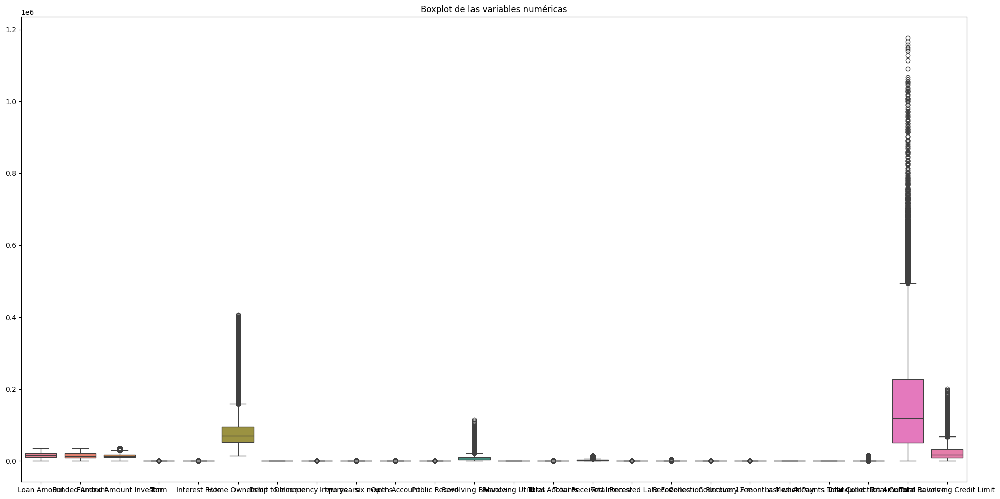

In [12]:
fig = plt.figure(figsize=(20, 10))
ax = sns.boxplot(data= numeric_variables)
plt.title('Boxplot de las variables numéricas')
plt.tight_layout()

**Insights**
- Se puede observar que los mínimos y máximos de los atributos numéricos son números razonables y se encuentran dentro de un rango esperado.

Se revisan las categorías y la frecuencia de ocurrencia de cada categoría para las variables categóricas:

In [15]:
categoric_variables = normal.select_dtypes(include=['object'])
categoric_variables

,ID,Grade,Employment Duration,Verification Status,Initial List Status,Application Type,Loan Status
0,65087372,B,MORTGAGE,Not Verified,w,INDIVIDUAL,0
1,1450153,C,RENT,Source Verified,f,INDIVIDUAL,0
2,1969101,F,MORTGAGE,Source Verified,w,INDIVIDUAL,0
3,6651430,C,MORTGAGE,Source Verified,w,INDIVIDUAL,0
4,14354669,C,MORTGAGE,Source Verified,w,INDIVIDUAL,0
...,...,...,...,...,...,...,...
61217,7273094,C,RENT,Verified,w,INDIVIDUAL,0
61218,35182714,C,RENT,Source Verified,w,INDIVIDUAL,0
61219,16435904,A,MORTGAGE,Verified,w,INDIVIDUAL,0
61220,5300325,D,OWN,Not Verified,f,INDIVIDUAL,0


In [16]:
text_cols_str = [text_col for text_col in  normal.select_dtypes(include=['object']).columns]
normal[text_cols_str].describe()

,ID,Grade,Employment Duration,Verification Status,Initial List Status,Application Type,Loan Status
count,61222,61222,61222,61222,61222,61222,61222
unique,61222,7,3,3,2,2,1
top,65087372,C,MORTGAGE,Source Verified,w,INDIVIDUAL,0
freq,1,17293,33128,29951,33072,61110,61222


Verificamos que los valores de cada columna categórica esten dentro de las opciones posibles.

In [17]:
categoric_variables["Grade"].unique()

array(['B', 'C', 'F', 'A', 'G', 'E', 'D'], dtype=object)

In [18]:
categoric_variables["Employment Duration"].unique()

array(['MORTGAGE', 'RENT', 'OWN'], dtype=object)

In [19]:
categoric_variables["Verification Status"].unique()

array(['Not Verified', 'Source Verified', 'Verified'], dtype=object)

In [20]:
categoric_variables["Initial List Status"].unique()

array(['w', 'f'], dtype=object)

In [21]:
categoric_variables["Application Type"].unique()

array(['INDIVIDUAL', 'JOINT'], dtype=object)

In [22]:
categoric_variables["Loan Status"].unique()

array([0], dtype=object)

Verificamos el porcentaje de distribución de las categorías de las variables categóricas:

In [23]:
categoric_variables

,ID,Grade,Employment Duration,Verification Status,Initial List Status,Application Type,Loan Status
0,65087372,B,MORTGAGE,Not Verified,w,INDIVIDUAL,0
1,1450153,C,RENT,Source Verified,f,INDIVIDUAL,0
2,1969101,F,MORTGAGE,Source Verified,w,INDIVIDUAL,0
3,6651430,C,MORTGAGE,Source Verified,w,INDIVIDUAL,0
4,14354669,C,MORTGAGE,Source Verified,w,INDIVIDUAL,0
...,...,...,...,...,...,...,...
61217,7273094,C,RENT,Verified,w,INDIVIDUAL,0
61218,35182714,C,RENT,Source Verified,w,INDIVIDUAL,0
61219,16435904,A,MORTGAGE,Verified,w,INDIVIDUAL,0
61220,5300325,D,OWN,Not Verified,f,INDIVIDUAL,0


In [26]:
categorical_variables = categoric_variables[["Initial List Status", "Application Type", "Loan Status"]]
for col in categorical_variables:
    print(f"Categorías y frecuencias para {col}")
    print(normal[col].value_counts(normalize=True))

Categorías y frecuencias para Initial List Status
Initial List Status
w    0.540198
f    0.459802
Name: proportion, dtype: float64
Categorías y frecuencias para Application Type
Application Type
INDIVIDUAL    0.998171
JOINT         0.001829
Name: proportion, dtype: float64
Categorías y frecuencias para Loan Status
Loan Status
0    1.0
Name: proportion, dtype: float64


In [ ]:
categorical_variables = categoric_variables[["Grade", "Employment Duration", "Verification Status"]]
for col in categorical_variables:
    print(f"Categorías y frecuencias para {col}")
    print(normal[col].value_counts(normalize=True))

Verificamos si existen valores nulos en el conjunto de datos.

In [27]:
pd.isna(normal).sum()

ID                              0
Loan Amount                     0
Funded Amount                   0
Funded Amount Investor          0
Term                            0
Interest Rate                   0
Grade                           0
Employment Duration             0
Home Ownership                  0
Verification Status             0
Debit to Income                 0
Delinquency - two years         0
Inquires - six months           0
Open Account                    0
Public Record                   0
Revolving Balance               0
Revolving Utilities             0
Total Accounts                  0
Initial List Status             0
Total Received Interest         0
Total Received Late Fee         0
Recoveries                      0
Collection Recovery Fee         0
Collection 12 months Medical    0
Application Type                0
Last week Pay                   0
Accounts Delinquent             0
Total Collection Amount         0
Total Current Balance           0
Total Revolvin

Verificamos si existen valores duplicados en el conjunto de datos.

In [28]:
normal.duplicated().sum()

0

Se genera un reporte completo, en formato HTML, para concluir con el proceso de perfilamiento:

In [30]:
profiling = ProfileReport(normal.copy())
profiling.to_file("profiling.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]/Users/mariacatalinaibanezpineres/Desktop/MAESTRIA/2024-10/Machine Learning/Taller5/env/lib/python3.11/site-packages/ydata_profiling/model/pandas/summary_pandas.py:39: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  series = series.fillna(np.nan)
Summarize dataset:  61%|██████    | 22/36 [00:00<00:00, 29.33it/s, Describe variable:Revolving Utilities]/Users/mariacatalinaibanezpineres/Desktop/MAESTRIA/2024-10/Machine Learning/Taller5/env/lib/python3.11/site-packages/ydata_profiling/model/pandas/summary_pandas.py:39: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, 

Adicionalmente, se decide graficar la distribucion entre las variables numéricas:	

<Figure size 2500x2000 with 0 Axes>

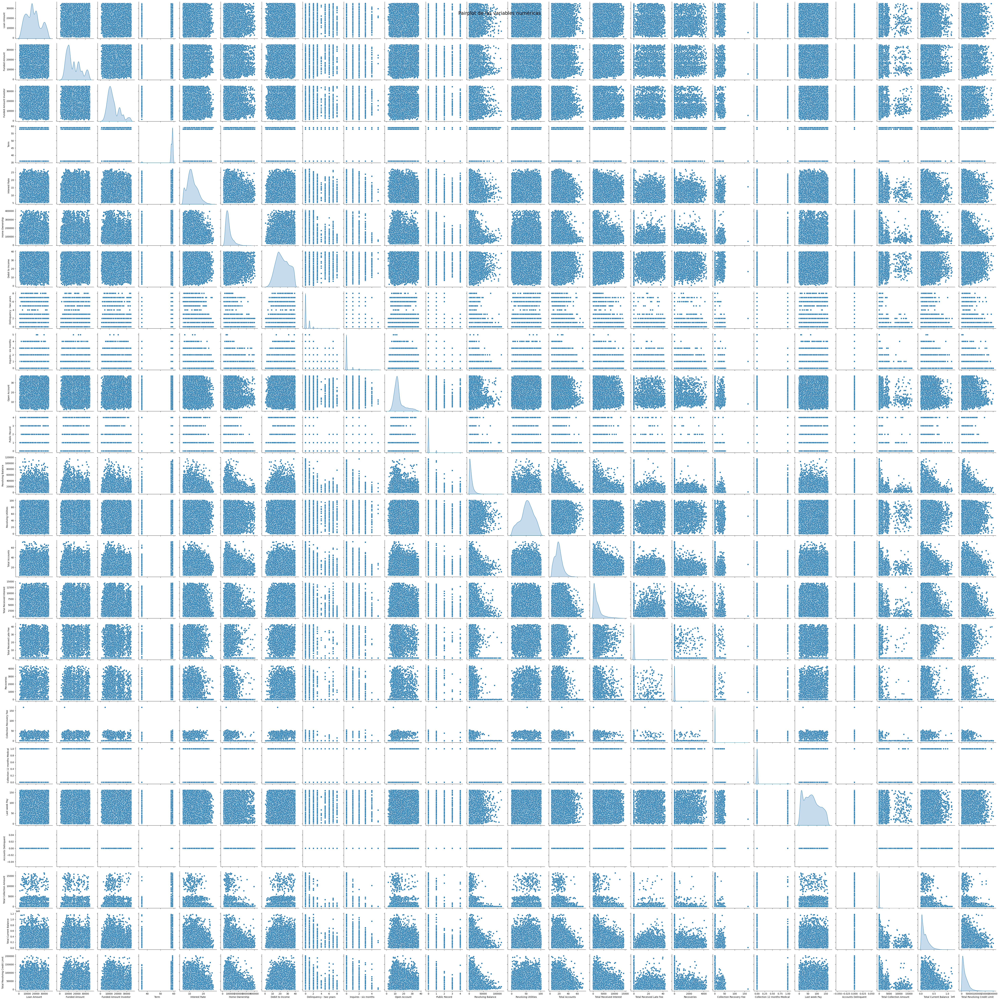

In [32]:
plt.figure(figsize=(25, 20))
train_num = normal[list(numeric_variables.columns)]

sns.pairplot(train_num, diag_kind='kde')
plt.suptitle('Pairplot de las variables numéricas', size = 20)
plt.show()

A continuación, se realiza un análisis sobre la correlación entre las variables predictoras. Un punto de base empírico para decidir si descartar una variable debido a su alta correlación es |0.8|. 

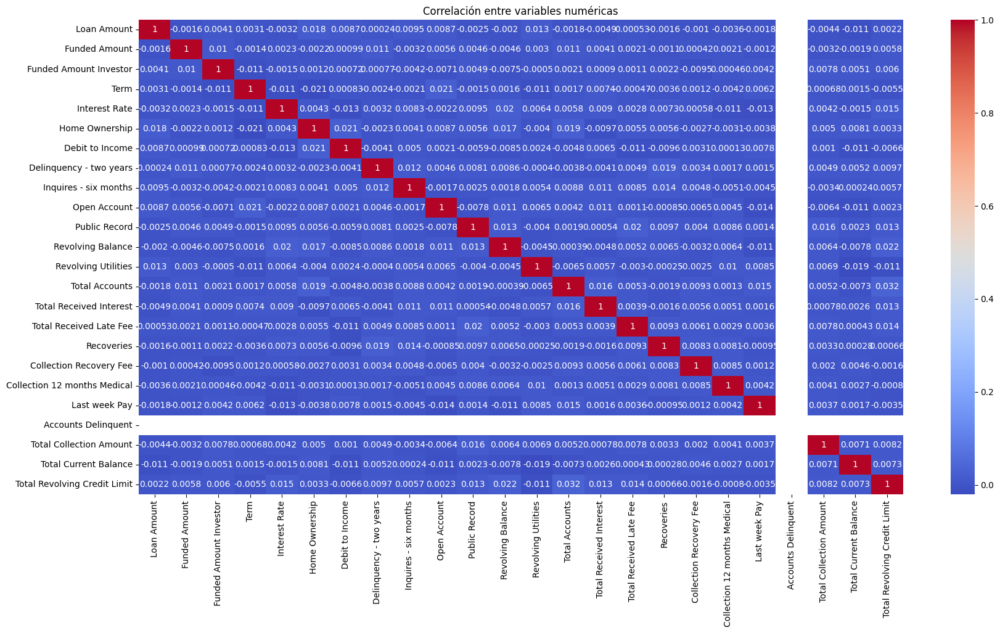

In [33]:
plt.figure(figsize = (20,10))
sns.heatmap(numeric_variables.corr(), annot = True, cmap="coolwarm")
plt.title('Correlación entre variables numéricas')
plt.show()

De acuerdo con el diccionario, lo único que se puede verificar es si las columnas son del tipo de dato que son (númerico|categórico). Para el dataset de entrenamiento se tiene de manera correcta esta información por lo que con respecto a este asunto no se presenta inconsistencia de datos. Ahora bien, con respecto a las variables numéricas es importante detectar outliers. Si la columna sigue una distribución normal, se puede utilizar la regla de oro de $\bar{x} \pm  3*std $. De lo contrario, no se puede asegurar que sean datos anómalos [1].

In [35]:
#############################################################################
# Utilizando la mediana
#############################################################################
features = list(numeric_variables.columns)
print(10*"*"+"Utilizando la mediana"+10*"*"+"\n")
for col in normal[features]:

    median = np.median(normal[col])
    mad = np.median(np.abs(normal[col] - median))
    mask = (normal[col] < (median - 3 * mad)) | (normal[col] > (median + 3 * mad))
    count = mask.sum()
    print(f"Total de datos Posiblemente anómalos en la columna {col}: {count} ({round(100*(count/normal[col].shape[0]),2)})")

**********Utilizando la mediana**********

Total de datos Posiblemente anómalos en la columna Loan Amount: 594 (0.97)
Total de datos Posiblemente anómalos en la columna Funded Amount: 6541 (10.68)
Total de datos Posiblemente anómalos en la columna Funded Amount Investor: 7044 (11.51)
Total de datos Posiblemente anómalos en la columna Term: 21693 (35.43)
Total de datos Posiblemente anómalos en la columna Interest Rate: 3126 (5.11)
Total de datos Posiblemente anómalos en la columna Home Ownership: 7217 (11.79)
Total de datos Posiblemente anómalos en la columna Debit to Income: 55 (0.09)
Total de datos Posiblemente anómalos en la columna Delinquency - two years: 13945 (22.78)
Total de datos Posiblemente anómalos en la columna Inquires - six months: 6335 (10.35)
Total de datos Posiblemente anómalos en la columna Open Account: 7322 (11.96)
Total de datos Posiblemente anómalos en la columna Public Record: 4124 (6.74)
Total de datos Posiblemente anómalos en la columna Revolving Balance: 6865 

In [36]:
#############################################################################
# Utilizando la media
#############################################################################
print("\n"+10*"*"+"Utilizando la media"+10*"*"+"\n")
for col in normal[features]:

    mean = normal[col].mean()
    std = normal[col].std()

    mask = (normal[col] < (mean - 3 * std)) | (normal[col] > (mean + 3 * std))
    count = mask.sum()
    print(f"Total de datos Posiblemente anómalos en la columna {col}: {count} ({round(100*(count/normal[col].shape[0]),2)})")


**********Utilizando la media**********

Total de datos Posiblemente anómalos en la columna Loan Amount: 0 (0.0)
Total de datos Posiblemente anómalos en la columna Funded Amount: 0 (0.0)
Total de datos Posiblemente anómalos en la columna Funded Amount Investor: 37 (0.06)
Total de datos Posiblemente anómalos en la columna Term: 1303 (2.13)
Total de datos Posiblemente anómalos en la columna Interest Rate: 316 (0.52)
Total de datos Posiblemente anómalos en la columna Home Ownership: 1114 (1.82)
Total de datos Posiblemente anómalos en la columna Debit to Income: 0 (0.0)
Total de datos Posiblemente anómalos en la columna Delinquency - two years: 905 (1.48)
Total de datos Posiblemente anómalos en la columna Inquires - six months: 2188 (3.57)
Total de datos Posiblemente anómalos en la columna Open Account: 1216 (1.99)
Total de datos Posiblemente anómalos en la columna Public Record: 405 (0.66)
Total de datos Posiblemente anómalos en la columna Revolving Balance: 1038 (1.7)
Total de datos Pos

In [37]:
##############################################################################
# Utilizando Median Interquartile Range
##############################################################################
print("\n"+10*"*"+"Utilizando cuartiles"+10*"*"+"\n")
for col in normal[features]:

    median = np.median(normal[features][col])
    q1, q3 = np.percentile(normal[features][col], [25, 75])
    iqr = q3 - q1

    mask = (normal[features][col] < (median - 1.5 * iqr)) | (normal[features][col] > (median + 1.5* iqr))

    count = mask.sum()
    print(f"Total de datos Posiblemente anómalos en la columna {col}: {count} ({round(100*(count/normal[col].shape[0]),2)})")


**********Utilizando cuartiles**********

Total de datos Posiblemente anómalos en la columna Loan Amount: 604 (0.99)
Total de datos Posiblemente anómalos en la columna Funded Amount: 3467 (5.66)
Total de datos Posiblemente anómalos en la columna Funded Amount Investor: 5980 (9.77)
Total de datos Posiblemente anómalos en la columna Term: 1303 (2.13)
Total de datos Posiblemente anómalos en la columna Interest Rate: 2891 (4.72)
Total de datos Posiblemente anómalos en la columna Home Ownership: 6626 (10.82)
Total de datos Posiblemente anómalos en la columna Debit to Income: 41 (0.07)
Total de datos Posiblemente anómalos en la columna Delinquency - two years: 13945 (22.78)
Total de datos Posiblemente anómalos en la columna Inquires - six months: 6335 (10.35)
Total de datos Posiblemente anómalos en la columna Open Account: 7322 (11.96)
Total de datos Posiblemente anómalos en la columna Public Record: 4124 (6.74)
Total de datos Posiblemente anómalos en la columna Revolving Balance: 6032 (9.8

In [38]:
normal.sample(20)

,ID,Loan Amount,Funded Amount,Funded Amount Investor,Term,Interest Rate,Grade,Employment Duration,Home Ownership,Verification Status,...,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Application Type,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit,Loan Status
27088,27245104,19237,30923,10217.991290,58,11.284418,D,OWN,69078.14197,Not Verified,...,4.530644,0.729789,0,INDIVIDUAL,83,0,37,136295,1775,0
23261,2311299,7229,24483,6132.281840,58,12.192087,C,OWN,26210.90641,Source Verified,...,6.094225,0.616210,0,INDIVIDUAL,62,0,26,77664,3407,0
23989,2581880,31722,16733,9225.537184,59,9.087521,A,RENT,53773.10477,Source Verified,...,9.181857,0.608293,0,INDIVIDUAL,98,0,37,349911,24563,0
11177,46370094,24220,32014,16342.124240,59,17.815041,D,RENT,152639.16700,Not Verified,...,0.903971,0.929120,0,INDIVIDUAL,24,0,29,293460,9702,0
51780,46773708,20422,11015,10861.815770,58,10.048410,B,MORTGAGE,88538.25465,Source Verified,...,3.192332,0.451719,1,INDIVIDUAL,117,0,2635,101751,21981,0
41152,38017334,16674,9761,33619.779880,59,15.283308,B,OWN,188479.94610,Verified,...,4.586722,0.973489,0,INDIVIDUAL,158,0,47,165675,10322,0
48218,12500136,18135,15202,5974.747160,59,9.649903,C,MORTGAGE,28129.84210,Source Verified,...,5.743230,0.600937,0,INDIVIDUAL,114,0,55,42436,16426,0
18082,7781897,7935,32416,13266.485670,58,10.562743,C,MORTGAGE,100906.41870,Source Verified,...,4.915042,0.954461,0,INDIVIDUAL,6,0,23,279681,6148,0
7759,40913666,15610,8030,16377.941150,59,18.535178,D,RENT,51564.78477,Source Verified,...,1.693835,0.389677,0,INDIVIDUAL,103,0,45,265493,1788,0
13622,55726354,26782,10224,15221.169800,58,18.112025,B,MORTGAGE,65378.73478,Source Verified,...,1.861629,0.722675,0,INDIVIDUAL,7,0,48,160880,2066,0


Aparece como categoría IMBALANCE en el reporte de profiling. Además, dado que la mayoría no cuenta con hijos y la etiqueta es > 90% se recomienda eliminar esta columna.

El 46.7% de los valores son cero pero en esta variable tiene sentido ya que pudo haber personas que no reservaran fines de semana. No se recomienda realizar ninguna transformación. 

**Insights obtenidos de la información**

Los datos tienen un total de 17 variables o características, un total de 29028 instancias. No tiene instancias (filas) duplicadas. Los tipos de datos para las variables se distribuyen de la siguiente forma:

- 24 numéricas
- 7 categóricas

Las recomendaciones de tratamiento de la información para cada una de las características, son las siguientes:

| Attribute Name | Description |
| --- | --- |
| ID |  Se recomienda eliminar esta característica, ya que es el identificador único y tiene alta cardinalidad. |
| Loan Amount |  Es una variable numérica de acuerdo al diccionario por lo que es válida. No cuenta con duplicados ni valores nulos. |
| Funded Amount |  Es una variable numérica de acuerdo al diccionario por lo que es válida. No cuenta con duplicados ni valores nulos. |
| Funded Amount Investor | Es una variable numérica. Esto es válido de acuerdo al diccionario. No presenta valores nulos ni duplicados. |
| Term | Es una variable numérica. Esto es válido de acuerdo al diccionario. No presenta valores nulos ni duplicados. |
| Interest Rate |  Es una variable numérica de acuerdo al diccionario por lo que es válida. No cuenta con duplicados ni valores nulos. |
| Grade |  Es una variable categórica de acuerdo al diccionario por lo que es válida. No cuenta con duplicados ni valores nulos. Tiene 7 categorías. Hay dos categorías (E y F) que tienen poco regustros, por lo que se podría recomendar unir estas dos y decir que es categoría Other. |
| Employment Duration |  Es una variable categórica; no obstante en el diccionario de datos dice que es el tiempo laborado por lo que uno esperaría una variable numérica. Se piensa que esta columna está intercambiada con la columna Home Ownership, ya que Home Ownership es propietario de vivienda, sin embrago está tiene valores numéricos. Se recomienda intercambiar con Home Ownership. Dado este intercambio ya tendría sentido los valores y no cuentan con valores nulos ni duplicados. |
| Home Ownership |  Es una variable numérica; no obstante, en el diccionario de datos dice que debería ser el propietario de la vivienda, por lo que debería ser categórica. Se recomienda intercambiar los valores de esta variable con los de Employment Duration. Hecho esto, los valores tendrían sentido y no cuentan con valores nulos ni duplicados.|
| Verification Status | Es una variable categórica de acuerdo con pandas profiling, esto concuerda con el diccionario. Además, no presenta valores nulos ni duplicados. Cuenta con 3 categorías. La que presenta más valores es "Source Verified" con 48.9% y la más baja es "Not Verified". |
| Debit to Income | Es una variable numérica. Esto concuerda con la variable del diccionario y no presenta valores nulos ni duplicados. |
| Delincuency - two years|  |
